<a href="https://colab.research.google.com/github/anshupandey/prompt_engineering/blob/main/code6_multiModal_LLMs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multimodal Prompting with GPT-4 Vision

# Multimodal Prompting with GPT-4 Vision

## Introduction to Multimodal Prompting

Multimodal prompting involves providing inputs to a large language model (LLM) that consist of more than one modality. For example, this could be text and an image, text and audio, or text and video. Multimodal LLMs like GPT-4 Vision (GPT-4V) are capable of understanding and generating responses based on these combined inputs. This allows for a richer and more nuanced interaction compared to purely text-based models.

GPT-4V specifically combines text and images. You can provide an image and ask questions about its content, ask the model to describe the image, or even use the image as context for a text-based task.

## Prompting Strategies for Multimodal LLMs (GPT-4V Focus)

Effective prompting is crucial for getting the best results from any LLM, and this is especially true for multimodal models where the interplay between different modalities is key. Here are some strategies specifically for prompting GPT-4V:

### 1. Clear and Specific Instructions

Just like with text-only models, providing clear, concise, and specific instructions is fundamental. When including an image, tell the model *what* you want it to do with that image.

*   **Example:** "Describe the main object in this image." vs. "Tell me about this."

### 2. Referencing Elements in the Image

If your prompt refers to specific parts of the image, make it clear what you're pointing to. While GPT-4V is powerful, ambiguity can lead to less accurate results.

*   **Strategy:** If possible, use bounding boxes or other visual cues in the prompt (though this might depend on the specific API or interface capabilities). If not, use descriptive language.
*   **Example:** "Identify the type of animal in the *center* of the image." or "What is the person wearing the *blue shirt* doing?"

### 3. Combining Text and Image for Context

The power of multimodal models lies in their ability to integrate information from both text and image. Use the text prompt to provide context, ask questions, or guide the model's interpretation of the image.

*   **Example:** You show an image of a restaurant menu and ask: "What is the price of the 'Margherita Pizza' on this menu?"
*   **Example:** You show an image of a complex diagram and ask: "Explain the process shown in this diagram, focusing on step 3."

### 4. Asking About Relationships and Interactions

Multimodal models can often understand relationships between objects in an image or interactions between people and their environment.

*   **Example:** Show an image of a person holding an object and ask: "What is the person doing with the object they are holding?"
*   **Example:** Show an image of multiple objects and ask: "How are the two objects on the table related?"

### 5. Using the Image as Input for Text Generation

The image doesn't just have to be something the model describes. It can serve as input or inspiration for generating text.

*   **Example:** Show an image of a scene and ask: "Write a short story inspired by this image."
*   **Example:** Show an image of a product and ask: "Generate a product description for this item based on the image."

### 6. Chain of Thought Prompting (Multimodal Variation)

Break down complex multimodal tasks into smaller steps. You can ask the model to first analyze the image in a specific way and then use that analysis to answer a question or perform another task.

*   **Example:** "First, identify all the different types of fruits in this image. Then, tell me which fruit is the most abundant."

### 7. Providing Examples (Few-Shot Prompting)

If you have specific output formats or types of analysis you want, providing examples of image-prompt-response pairs can help guide the model.

*   **Example:**
    *   **Image 1:** [Image of a red car]
    *   **Prompt 1:** "Identify the color and type of vehicle."
    *   **Response 1:** "Color: Red, Type: Car"
    *   **Image 2:** [Image of a blue bike]
    *   **Prompt 2:** "Identify the color and type of vehicle."
    *   **Response 2:** "Color: Blue, Type: Bicycle"
    *   **Image 3:** [New image of a green truck]
    *   **Prompt 3:** "Identify the color and type of vehicle."

### 8. Specifying Output Format

Clearly state the desired format for the response (e.g., bullet points, a summary, a list, JSON).

*   **Example:** "List the objects in the image using bullet points."
*   **Example:** "Provide a JSON object containing the identified objects and their estimated locations."

### 9. Asking About Style, Mood, or Abstract Concepts

GPT-4V can sometimes interpret more abstract qualities of an image, although this can be more challenging and results may vary.

*   **Example:** "Describe the overall mood of this image."
*   **Example:** "What artistic style does this image resemble?"



In [ ]:
import os
import requests
import base64

In [ ]:
model_name="gpt-4o"

In [ ]:

# Configuration
from openai import OpenAI
client = OpenAI()

### Working with Image URL

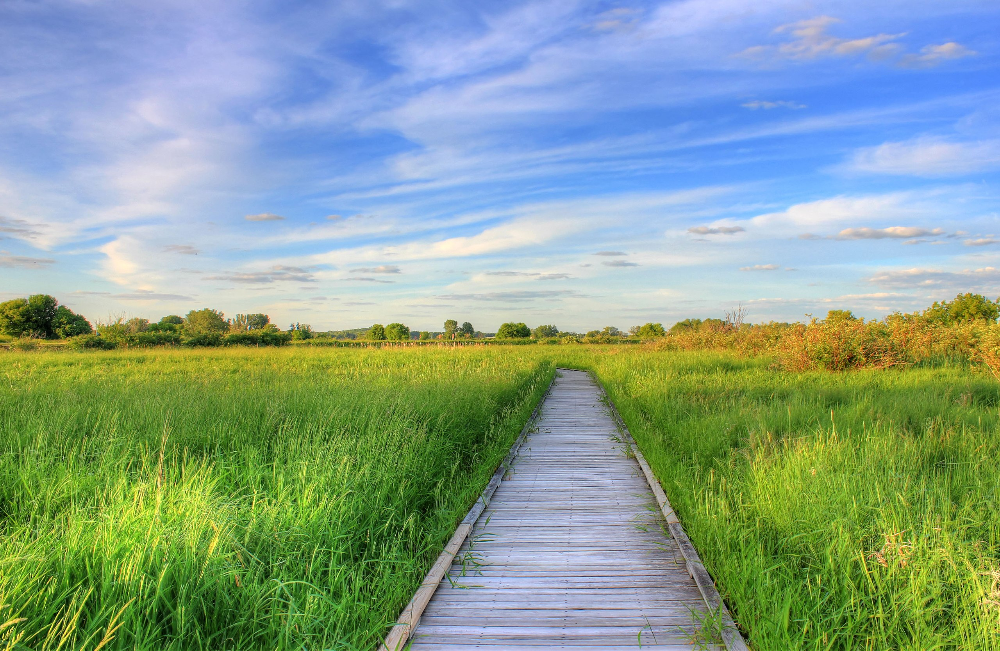

In [ ]:
from PIL import Image
import requests
from io import BytesIO

# URL of the image
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/dd/Gfp-wisconsin-madison-the-nature-boardwalk.jpg/2560px-Gfp-wisconsin-madison-the-nature-boardwalk.jpg"

# Fetch the image
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))

# Display the image
img

In [ ]:

response = client.responses.create(
    model=model_name,
    input=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "What's in this image?"},
                {
                    "type": "image_url",
                    "image_url": {
                        "url": "https://upload.wikimedia.org/wikipedia/commons/thumb/d/dd/Gfp-wisconsin-madison-the-nature-boardwalk.jpg/2560px-Gfp-wisconsin-madison-the-nature-boardwalk.jpg",
                    },
                },
            ],
        }
    ],
    max_output_tokens=300,
)

print(response.choices[0])

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='The image depicts a scenic outdoor landscape featuring a wooden walkway or path that runs through a field of tall green grass. The path leads towards a horizon with trees and shrubs visible on either side. The sky is bright with a few clouds, suggesting a pleasant day. Overall, it conveys a peaceful natural setting.', refusal=None, role='assistant', audio=None, function_call=None, tool_calls=None))


In [ ]:
!wget -q https://raw.githubusercontent.com/anshupandey/ms-generativeai-apr2025/refs/heads/main/generative-ai_image_covid_chart.png -O generative-ai_image_covid_chart.png

### Working with Bytes Encoded Image

In [ ]:
# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


# Path to your image
image_path = "generative-ai_image_covid_chart.png"
# Getting the base64 string
base64_image = encode_image(image_path)

In [ ]:
response = client.responses.create(
    model="gpt-4o-mini",
    inputs=[{"role": "system", "content": [{ "type": "text",
          "text": "You are an AI assistant that helps people find information."}]},
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "What is in this image?",
                },
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"},
                },
            ],
        }
    ],
)



Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='The image is a bar chart showing the share of people vaccinated against COVID-19 in various countries as of September 2, 2021. It compares the percentage of people who are fully vaccinated with those who are only partly vaccinated.\n\nKey points include:\n\n- **China** has the highest percentage of fully vaccinated individuals at 74%.\n- **Italy** and **Germany** follow with 71% and 60%, respectively.\n- The **United States** has 52% fully vaccinated.\n- **Mexico** shows a significant gap with 27% fully vaccinated.\n- The percentages for countries like **Taiwan**, **India**, **Thailand**, **Indonesia**, and **Vietnam** are lower, with Vietnam having only 2.8% fully vaccinated.\n\nThe chart emphasizes the varying levels of vaccination across these countries.', refusal=None, role='assistant', audio=None, function_call=None, tool_calls=None))


In [ ]:
print(response.output_text)

The image is a bar chart showing the share of people vaccinated against COVID-19 in various countries as of September 2, 2021. It compares the percentage of people who are fully vaccinated with those who are only partly vaccinated.

Key points include:

- **China** has the highest percentage of fully vaccinated individuals at 74%.
- **Italy** and **Germany** follow with 71% and 60%, respectively.
- The **United States** has 52% fully vaccinated.
- **Mexico** shows a significant gap with 27% fully vaccinated.
- The percentages for countries like **Taiwan**, **India**, **Thailand**, **Indonesia**, and **Vietnam** are lower, with Vietnam having only 2.8% fully vaccinated.

The chart emphasizes the varying levels of vaccination across these countries.


In [ ]:
response = client.responses.create(
    model="gpt-4o-mini",
    input=[{"role": "system", "content": [{ "type": "text",
          "text": "You are an AI assistant that helps people find information."}]},
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "extract the statistics from the image and provide as markdown table",
                },
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"},
                },
            ],
        }
    ],
)

In [ ]:
print(response.output_text)

Here are the statistics extracted from the image, presented in a markdown table:

| Country        | Share of Fully Vaccinated (%) | Share of Partly Vaccinated (%) |
|----------------|-------------------------------|---------------------------------|
| China          | 74%                           | 13%                             |
| Italy          | 71%                           | 9.7%                            |
| Germany        | 65%                           | 4.5%                            |
| United States   | 61%                           | 9.3%                            |
| Mexico         | 45%                           | 18%                             |
| Taiwan         | 42%                           | 38%                             |
| India          | 37%                           | 26%                             |
| Thailand       | 33%                           | 22%                             |
| Indonesia      | 24%                           | 10%              

## Try Yourself: Object Detection

In [ ]:

response = client.responses.create(
    model=model_name,
    messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "Identify the objects in this image and their approximate locations."},
                {
                    "type": "image_url",
                    "image_url": {
                        "url": image_url,
                    },
                },
            ],
        }
    ],
    max_tokens=300,
)

print("Object Detection Example:")
print(response.output_text)

### 10. Be Mindful of Limitations and Biases

Multimodal models, like all AI models, have limitations. They might misinterpret certain images, struggle with low-quality images, or exhibit biases present in their training data. Be prepared to refine prompts or handle potential inaccuracies.

## Conclusion

Multimodal prompting with models like GPT-4V opens up powerful new possibilities for interacting with AI. By employing clear instructions, leveraging the interplay between text and image, and experimenting with different strategies, you can unlock the full potential of these advanced models for a wide range of tasks, from image description and analysis to creative content generation.

## Thank You